In [1]:
from torchvision import models, transforms

In [2]:
print(dir(models))

['AlexNet', 'DenseNet', 'Inception3', 'ResNet', 'SqueezeNet', 'VGG', '__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__path__', '__spec__', 'alexnet', 'densenet', 'densenet121', 'densenet161', 'densenet169', 'densenet201', 'inception', 'inception_v3', 'resnet', 'resnet101', 'resnet152', 'resnet18', 'resnet34', 'resnet50', 'squeezenet', 'squeezenet1_0', 'squeezenet1_1', 'vgg', 'vgg11', 'vgg11_bn', 'vgg13', 'vgg13_bn', 'vgg16', 'vgg16_bn', 'vgg19', 'vgg19_bn']


In [3]:
resnet = models.resnet101(pretrained=True)

In [4]:
resnet

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [5]:
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225])
])

In [9]:
from PIL import Image
img = Image.open("/Users/matthewleinhauser/Desktop/IMG_2831.jpg")

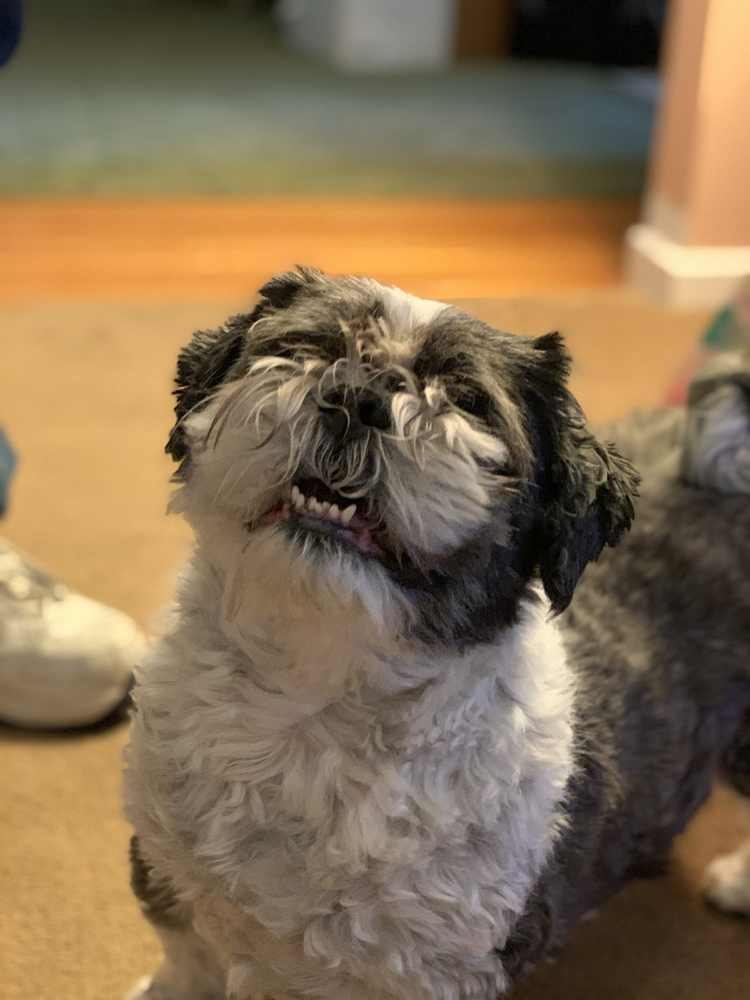

In [10]:
img

In [11]:
img_t = preprocess(img)

In [12]:
import torch
batch_t = torch.unsqueeze(img_t, 0)

In [13]:
resnet.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [14]:
out = resnet(batch_t)
out

tensor([[-4.1611e+00, -1.5680e+00, -1.8483e+00, -1.7090e+00, -2.7739e+00,
         -2.9586e+00, -2.5656e+00,  1.7786e+00,  1.5216e+00,  2.5048e-01,
          2.6574e+00, -1.7040e+00,  1.5411e-01,  2.0973e+00, -8.1239e-01,
          1.0251e+00,  2.9416e+00,  1.3007e+00, -3.1160e-01,  1.9022e+00,
          1.7007e+00,  1.1950e+00, -1.9440e+00, -1.5000e+00, -1.5052e-02,
         -2.5783e+00, -1.0130e+00, -7.3791e-01, -2.2654e+00, -9.4223e-01,
         -3.3828e+00, -2.7999e+00, -2.0769e+00, -2.7467e+00, -9.5015e-01,
         -1.6754e-01, -6.4234e-01, -1.9411e+00,  4.7918e-01, -3.2187e-01,
         -7.7552e-01,  2.1512e+00, -2.0724e-01,  1.3513e+00,  1.2987e+00,
          1.0616e+00, -8.2253e-01,  2.9131e-02,  8.0572e-01, -5.6037e-01,
         -1.5199e+00, -2.4978e-01,  4.8028e-01, -1.0901e+00, -1.0165e+00,
          8.8203e-01, -2.3661e-01, -1.3592e+00, -6.4942e-01,  1.9449e+00,
          1.7978e+00, -1.0216e+00,  2.0348e+00,  5.4944e-01,  5.6234e-01,
         -2.7338e+00,  1.8761e+00,  2.

In [15]:
with open("imagenet_classes.txt") as f:
    labels = [line.strip() for line in f.readlines()]

In [16]:
_, index = torch.max(out, 1)

In [17]:
percentage = torch.nn.functional.softmax(out, dim=1)[0] * 100
labels[index[0]], percentage[index[0]].item()

('Shih-Tzu', 71.08641815185547)

In [18]:
_, indices = torch.sort(out, descending=True)
[(labels[idx], percentage[idx].item()) for idx in indices[0][:5]]

[('Shih-Tzu', 71.08641815185547),
 ('Lhasa, Lhasa apso', 28.399944305419922),
 ('Pekinese, Pekingese, Peke', 0.20525553822517395),
 ('Tibetan terrier, chrysanthemum dog', 0.17910853028297424),
 ('affenpinscher, monkey pinscher, monkey dog', 0.0628490149974823)]